# install & load modules

In [28]:
### install module
#!pip install nibabel
#!pip3 install numpy
#!pip3 install ipdb
#!pip3 install nilearn
#!pip3 install scikit-image
#!pip install matplotlib

### do not need to install for this code
#!pip3 install torch
#!pip3 install monai

In [25]:
### load module
import nibabel as nib
import numpy as np
import ipdb
from ipdb import set_trace

import re #regular expression
import os
import csv
from nilearn import plotting
from skimage.transform import resize
#import torch
from monai.transforms import ScaleIntensity

# main code

In [29]:
arr = range(0, 64, 64 // 15)
ratio_map = {}
count = [0]
padding = 10

# main function
def dive(root): 
    for f in os.listdir(root):
        path = f'{root}/{f}'
        
        # ends with "brain.nii.gz"
        if f.endswith('brain.nii.gz'):
            root = '/scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain'
            # (1) cut unnecessary part
            clean_space(root, f) #load clean space function
            
            # (2) show image
            subjectname = re.sub('.brain.nii.gz','',f)
            root = '/scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped'      
            path = rf'{root}/{subjectname}.brain_crop.nii.gz'
            img = nib.load(path)
            np_img = np.array(img.get_fdata())
            data = resize(np_img, (64, 64, 64), mode='constant')
            
            #Min-max scaling
#             transform = ScaleIntensity(minv=-1.0, maxv=1.0) #[-1,1] MinMax scaler
#             data = transform(data)
            
            data_nii = nib.Nifti1Image(data, np.eye(4))
            
            plotting.plot_anat(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='x')
            plotting.plot_anat(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='y')
            plotting.plot_anat(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='z')
            plotting.show()
            
            count[0] += 1
            print(f'count: {count[0]} processed: {root}/{f}')
            
        # [file tree] directory - file  > recursively work
        if f.endswith('flair.nii.gz') or f.endswith('t2.nii.gz'):
            os.system(f'gunzip {path}')
        elif os.path.isdir(path):
            dive(path)


### clean function
## function for clean_space function
def clean_axis(np_img, path, axis=0):
    x_len, y_len, z_len = len(np_img), len(np_img[0]), len(np_img[0, 0])
    zero_mask = np.zeros(0)
    del_inds = []
    save_i = -1
    iter_len = 0
    continuity_warning = 0
    
    if axis == 0: 
        zero_mask = np.zeros((y_len, z_len))
        iter_len = x_len
    elif axis == 1: 
        zero_mask = np.zeros((x_len, z_len))
        iter_len = y_len
    elif axis == 2: 
        zero_mask = np.zeros((x_len, y_len))
        iter_len = z_len
    for i in range(iter_len):
        plane = np.sum(np_img[i] != zero_mask) if axis == 0 else np.sum(np_img[:, i] != zero_mask) if axis == 1 else np.sum(np_img[:, :, i] != zero_mask) 
        if plane == 0: 
            del_inds.append(i)
            if save_i + 1 != i: continuity_warning += 1
            save_i = i

    # cannot allow two breakpoints in del_inds
    if continuity_warning >= 2: print(f'\x1b[31m broken del_inds: {path} \n axis: {axis} \x1b[0m') 
        
    # remove empty slices (every other slice to maintain the empty space ratio)
    np_img = np.delete(np.swapaxes(np_img, 0, axis), del_inds, 0)
    # add padding
    zero_mask = np.zeros((len(np_img[0]), len(np_img[0, 0])))
    np_img = np.insert(np_img, [0 for i in range(padding)], zero_mask, 0)
    np_img = np.insert(np_img, [len(np_img) for i in range(padding)], zero_mask, 0)
    
    return np.swapaxes(np_img, 0, axis)


## main function = 'clean_space'
# clean the 0-intensity space surrounding the brain
def clean_space(root, f):
    img_pth = rf'{root}/{f}'
    subjectname=re.sub('.brain.nii.gz','',f)
    
    # input data = npy
    #np_img = np.load(img_pth)
    
    # input data = nii
    img = nib.load(img_pth)
    np_img = np.array(img.get_fdata())
        
    #clean axes (cleaned img)
    np_img = clean_axis(np_img, img_pth, axis=0)
    np_img = clean_axis(np_img, img_pth, axis=1)
    np_img = clean_axis(np_img, img_pth, axis=2)
    
    # make .mgz / .nii with cleaned img
    if f.endswith('mgz'):
        # write to disk
        feat = nib.freesurfer.mghformat.MGHImage(np_img, img.affine, img.header)
    elif f.endswith('nii.gz'):
        root = '/scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped'      
        img_pth_nii = rf'{root}/{subjectname}.brain_crop.nii.gz' #
        img_pth_npy = rf'{root}/{subjectname}.brain_crop.npy'
        feat = nib.Nifti1Image(np_img, img.affine, header=img.header) #chage data as nifti format
        nib.save(feat, img_pth_nii)
        np.save(img_pth_npy, np_img) #

# visualization w/ all subjects

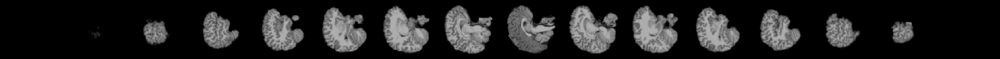

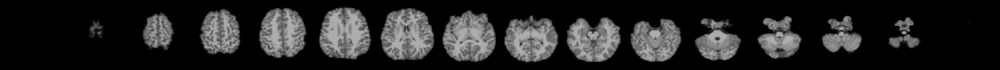

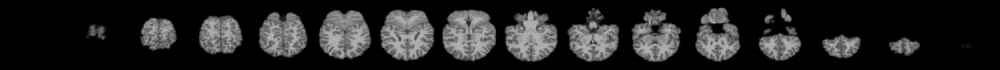

count: 1 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVC2ZLETPN.brain.nii.gz


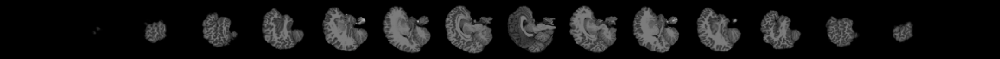

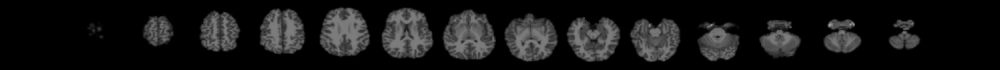

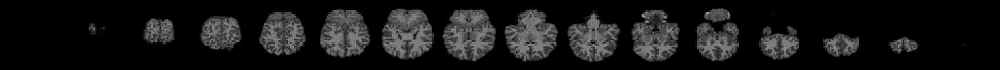

count: 2 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVDADVB5PG.brain.nii.gz


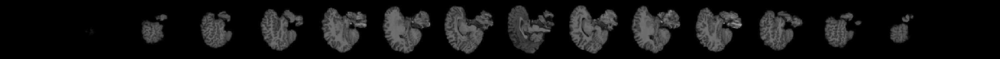

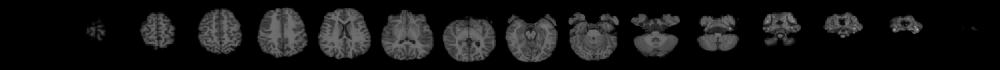

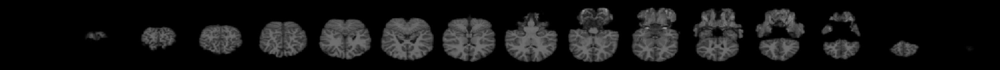

count: 3 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVFTEDMTCZ.brain.nii.gz


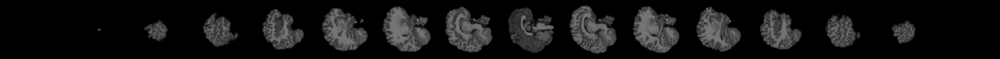

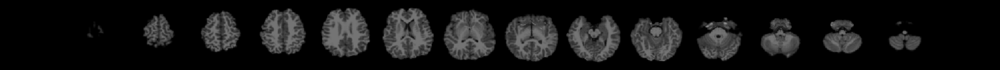

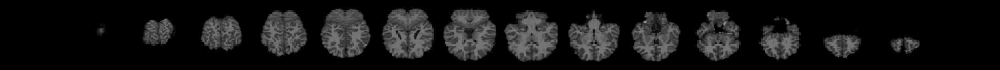

count: 4 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVLDK00HZG.brain.nii.gz


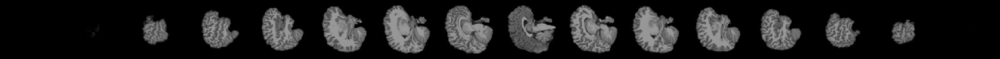

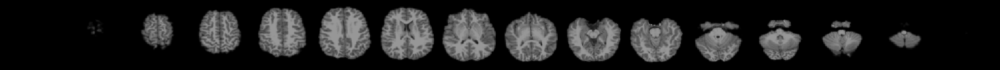

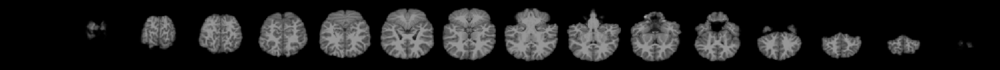

count: 5 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVZX24TGXN.brain.nii.gz


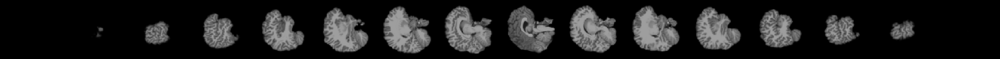

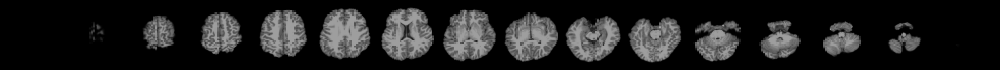

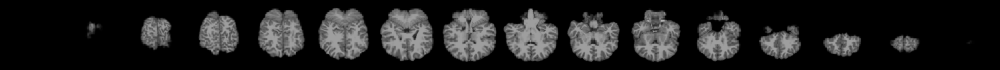

count: 6 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV67LUTZ66.brain.nii.gz


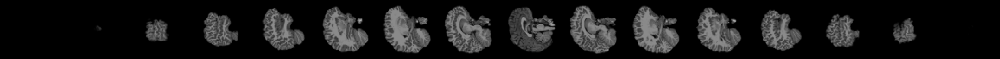

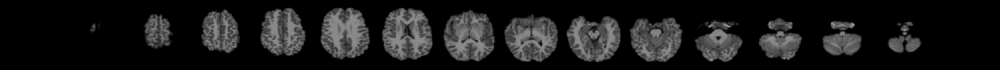

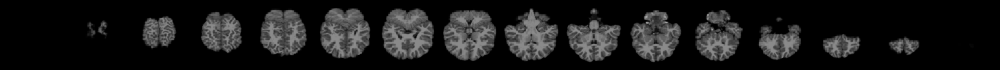

count: 7 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV5XN1DB2X.brain.nii.gz


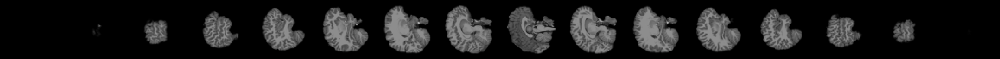

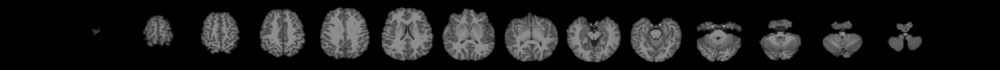

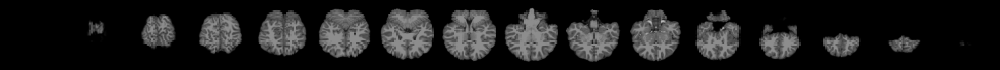

count: 8 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV39L5JHFA.brain.nii.gz


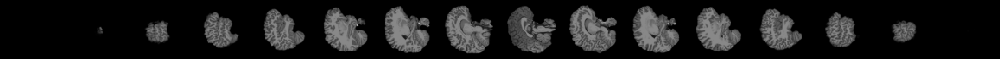

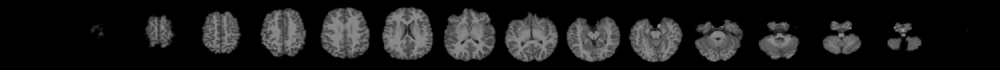

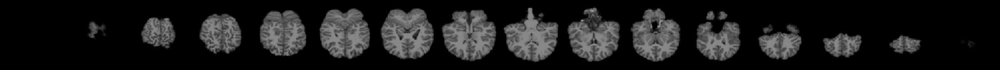

count: 9 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVPAJ2K2CD.brain.nii.gz


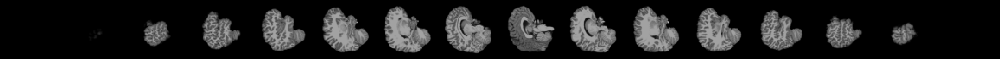

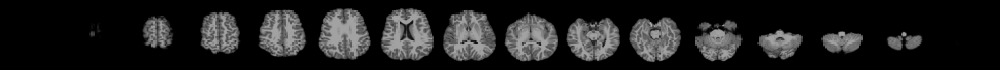

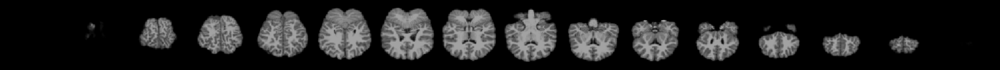

count: 10 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVA2KW69TW.brain.nii.gz


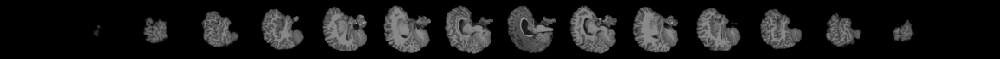

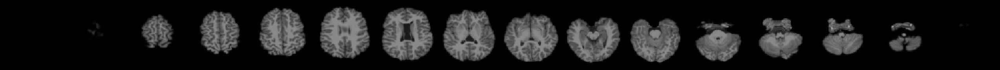

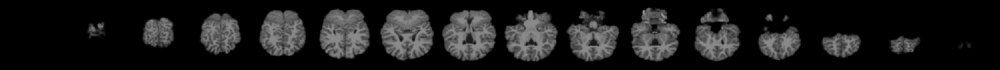

count: 11 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV4ET3VY02.brain.nii.gz


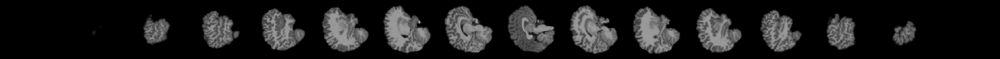

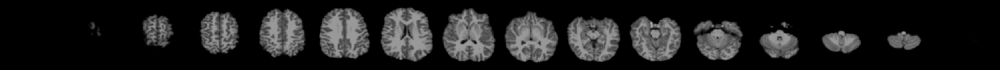

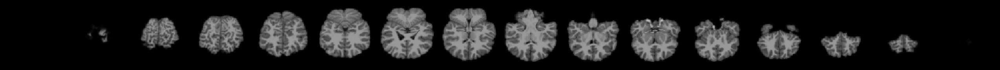

count: 12 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVPMYB46U3.brain.nii.gz


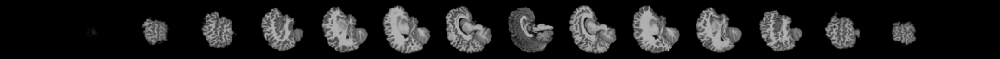

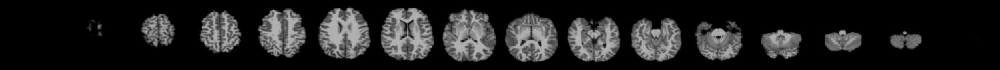

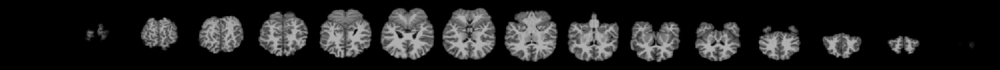

count: 13 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVH30DZ5Z7.brain.nii.gz


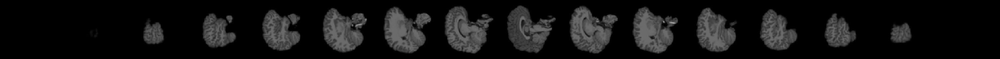

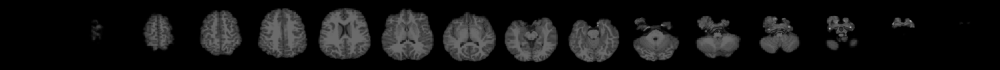

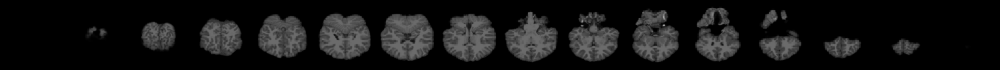

count: 14 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV6RPBF276.brain.nii.gz


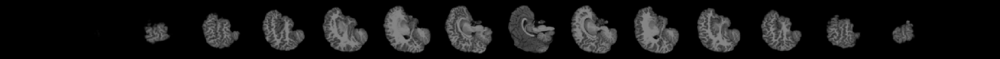

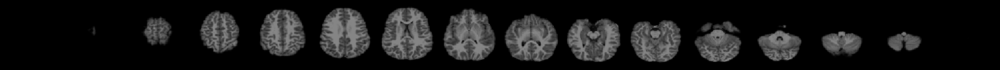

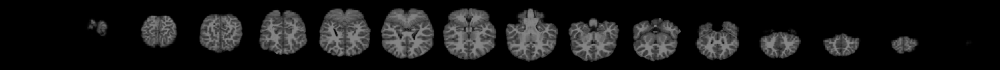

count: 15 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVM4649VK1.brain.nii.gz


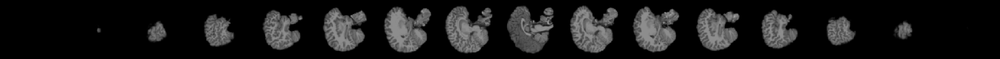

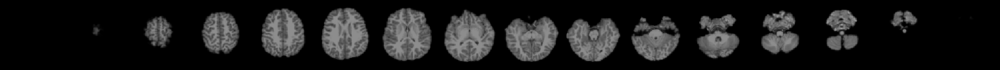

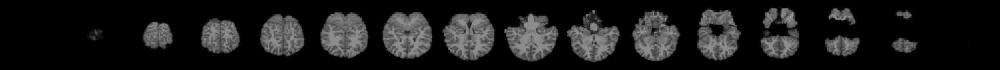

count: 16 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV4G3XF9GX.brain.nii.gz


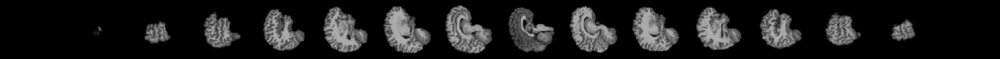

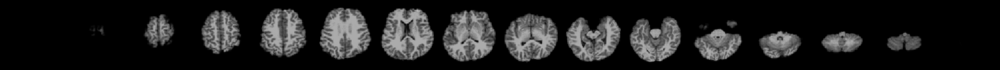

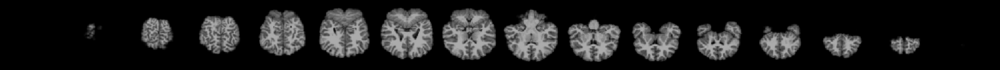

count: 17 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVK15CAZPG.brain.nii.gz


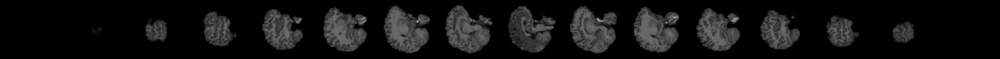

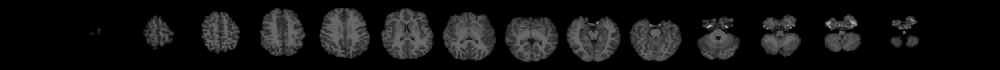

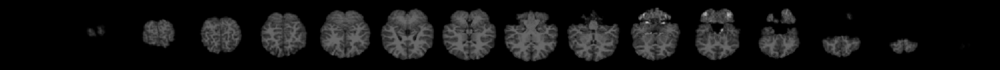

count: 18 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVYUXB5PRZ.brain.nii.gz


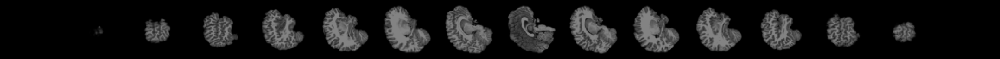

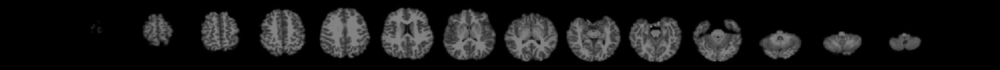

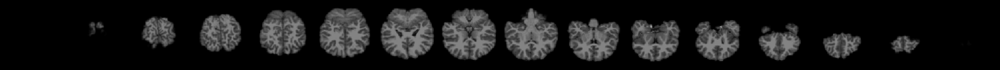

count: 19 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVRHKAEMD9.brain.nii.gz


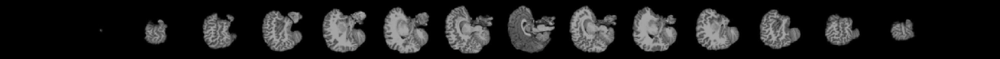

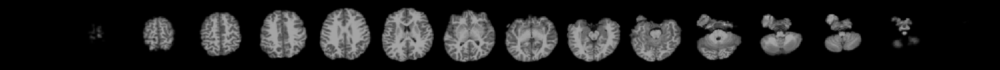

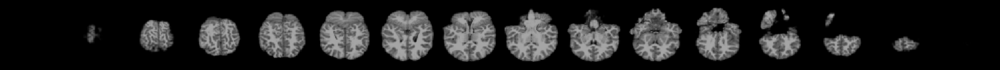

count: 20 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV1NBATKW5.brain.nii.gz


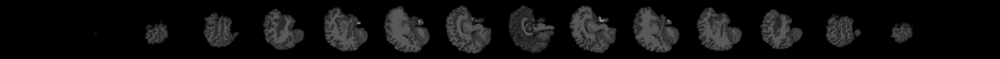

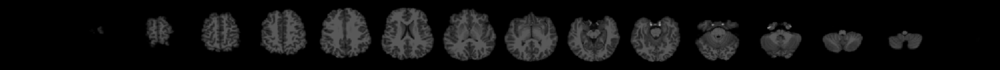

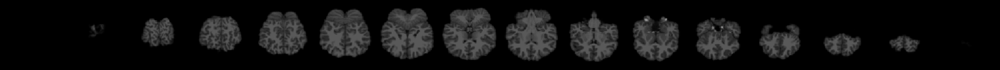

count: 21 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV6Y7D78GZ.brain.nii.gz


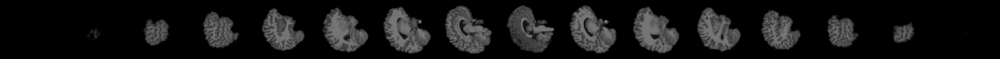

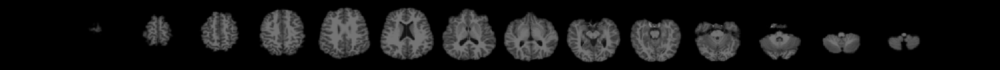

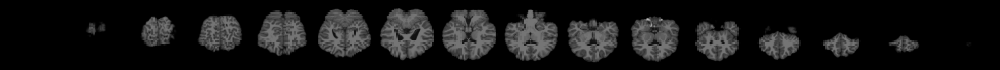

count: 22 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVETR322Y3.brain.nii.gz


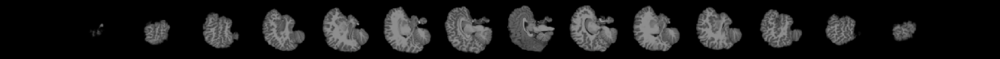

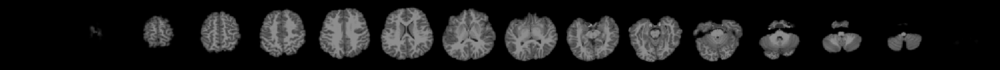

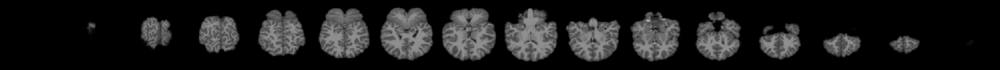

count: 23 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVVJBX89D6.brain.nii.gz


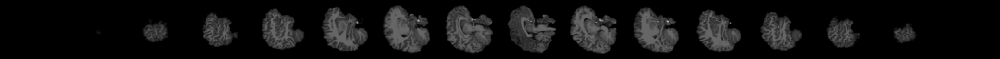

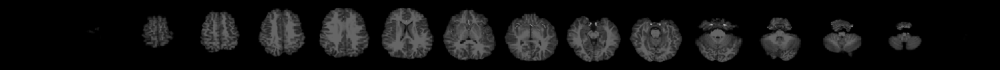

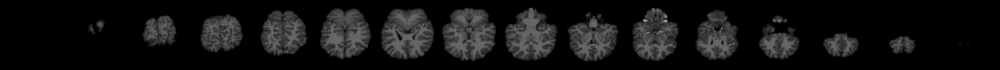

count: 24 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVCPAB62JD.brain.nii.gz


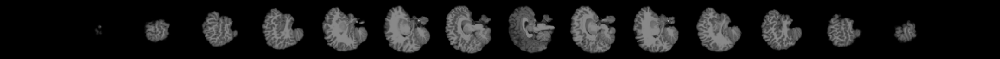

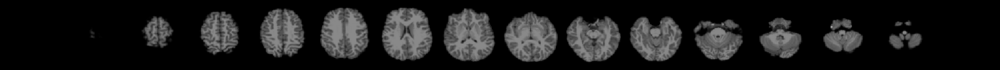

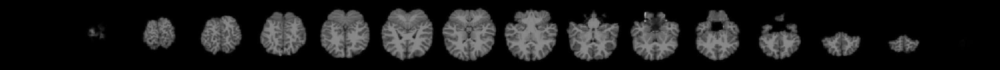

count: 25 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVZH7LD600.brain.nii.gz


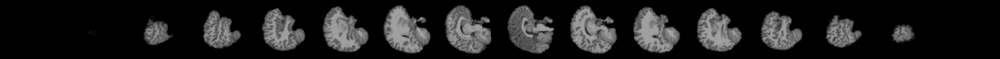

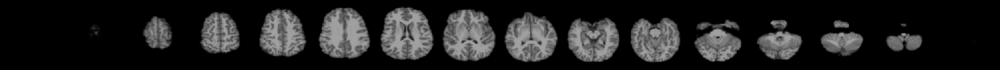

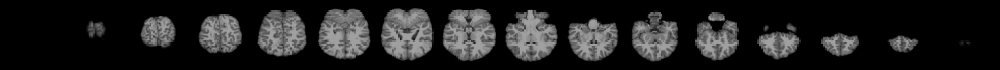

count: 26 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVG7TMENCV.brain.nii.gz


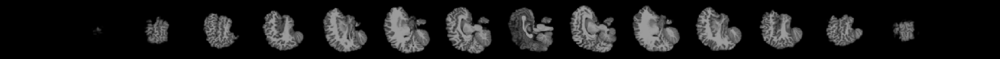

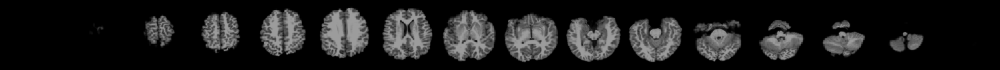

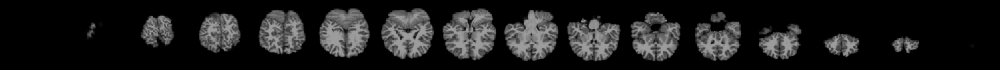

count: 27 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV900G0AZU.brain.nii.gz


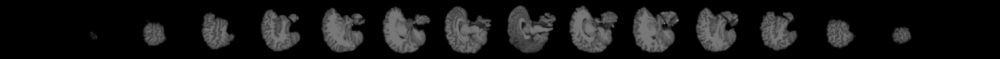

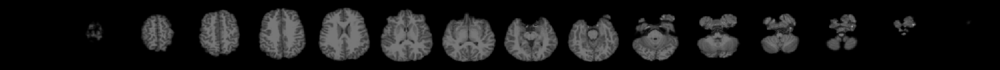

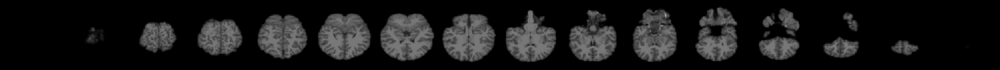

count: 28 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVM8PMJ7MH.brain.nii.gz


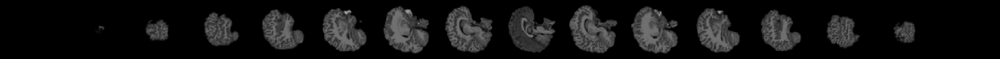

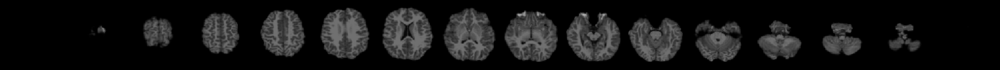

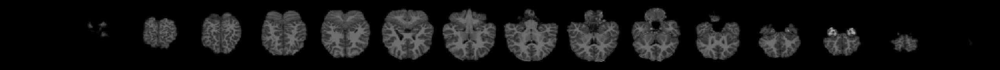

count: 29 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVNHKNUNA6.brain.nii.gz


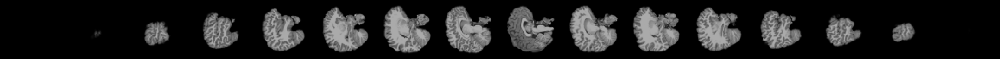

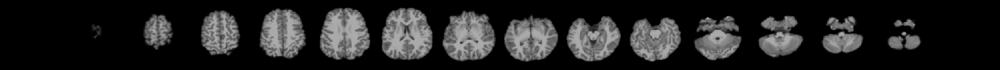

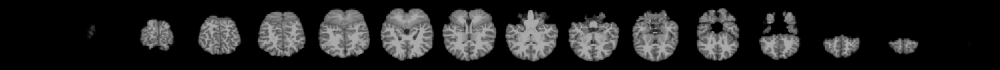

count: 30 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV16C687G5.brain.nii.gz


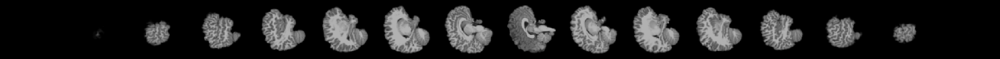

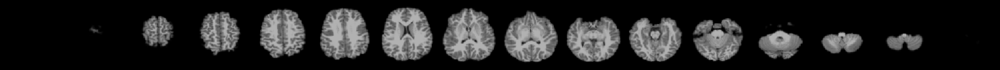

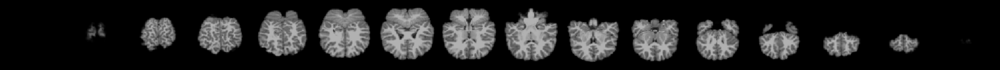

count: 31 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV6A16UBJN.brain.nii.gz


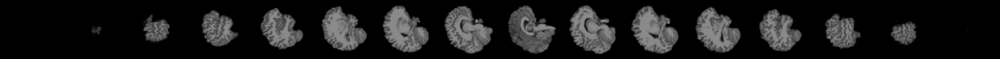

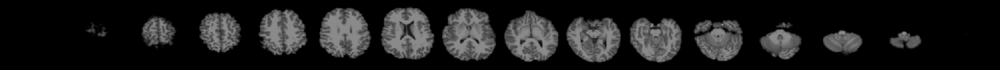

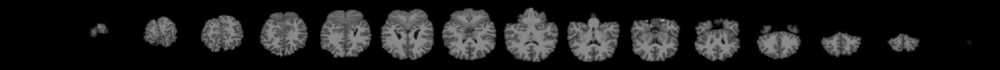

count: 32 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVTXB709BK.brain.nii.gz


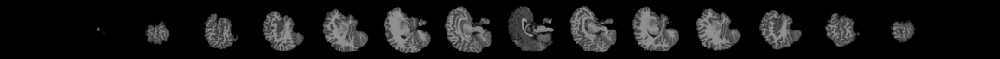

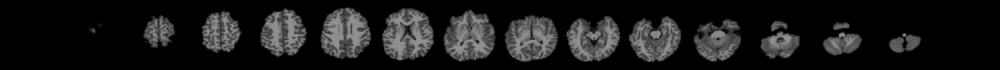

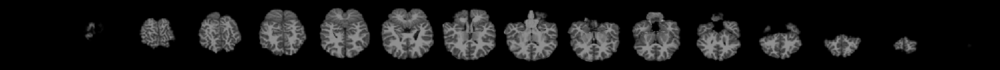

count: 33 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVCGHNP1DK.brain.nii.gz


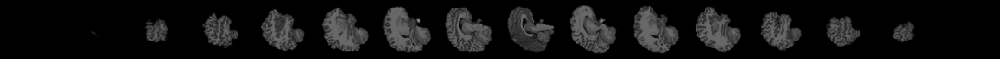

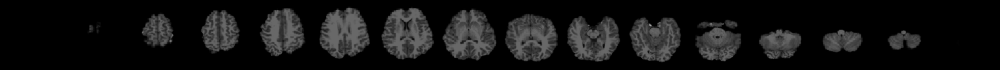

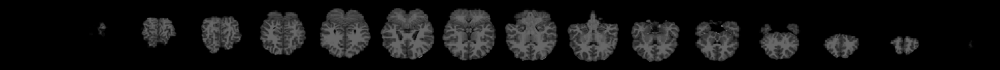

count: 34 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV36K7YFLB.brain.nii.gz


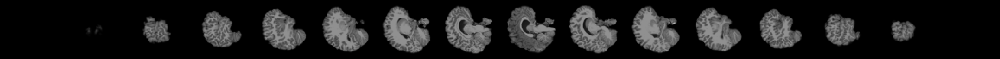

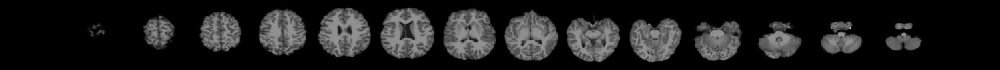

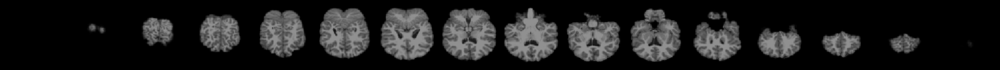

count: 35 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV2LXFHK41.brain.nii.gz


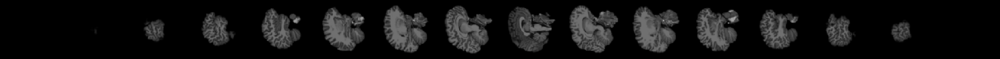

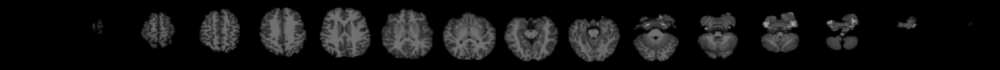

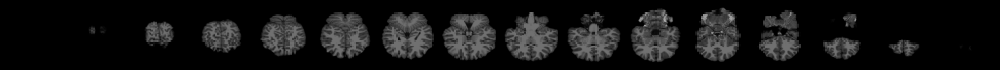

count: 36 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVWEJMEVJN.brain.nii.gz


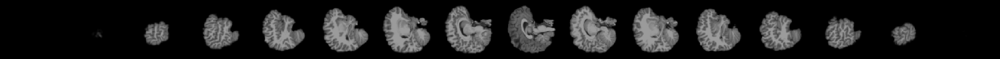

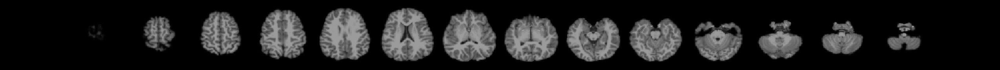

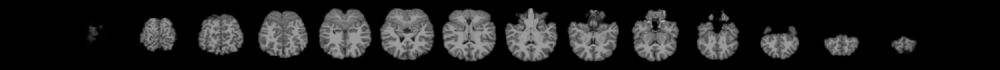

count: 37 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVK8G0M5HW.brain.nii.gz


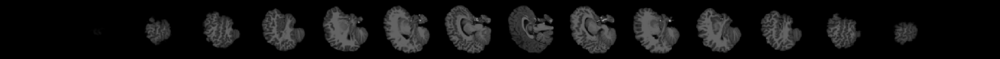

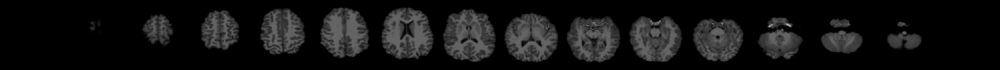

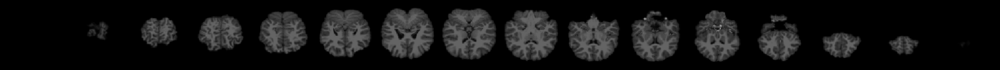

count: 38 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVAAX7P792.brain.nii.gz


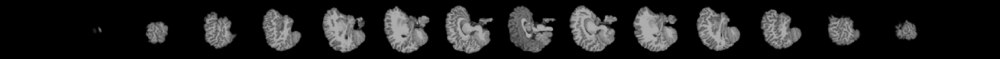

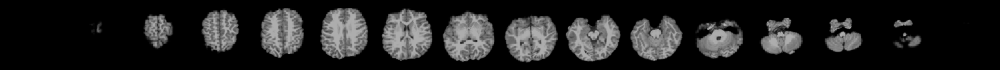

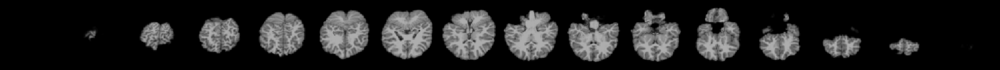

count: 39 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV0LKZCJ15.brain.nii.gz


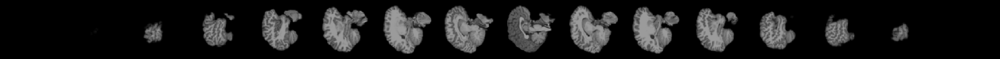

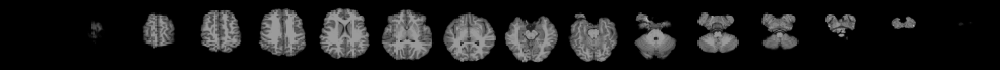

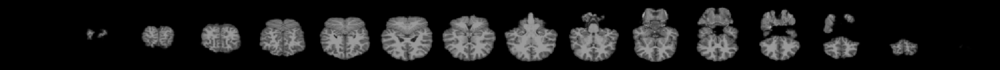

count: 40 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVZ6C6W2MX.brain.nii.gz


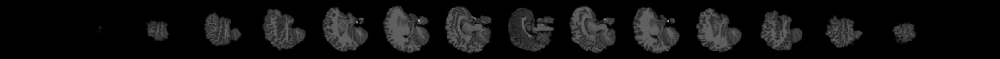

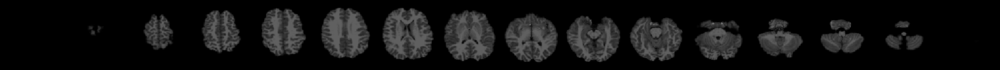

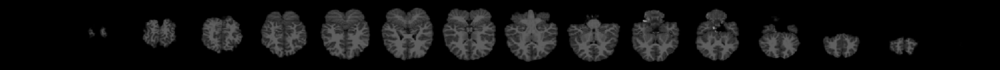

count: 41 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVN8V9JFDL.brain.nii.gz


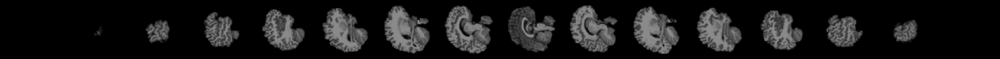

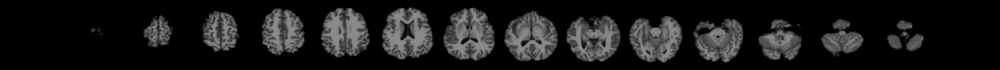

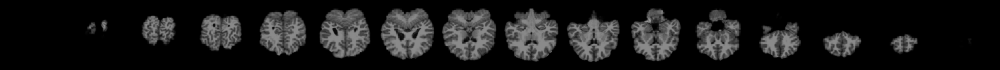

count: 42 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVRPY0VAPZ.brain.nii.gz


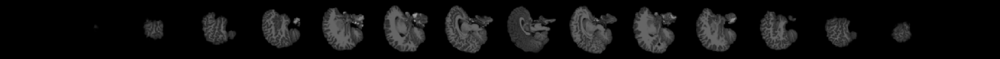

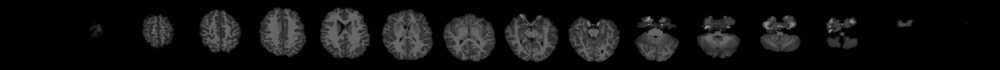

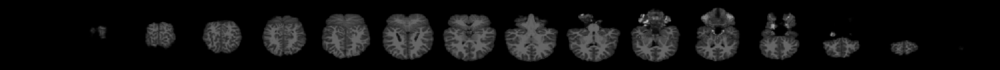

count: 43 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVE6E13XJZ.brain.nii.gz


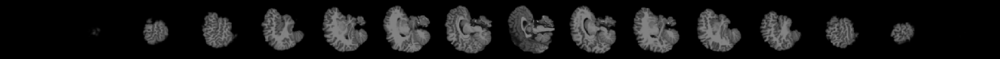

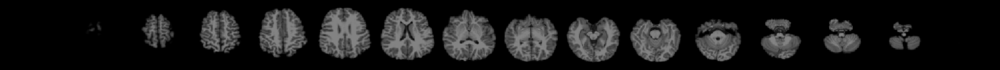

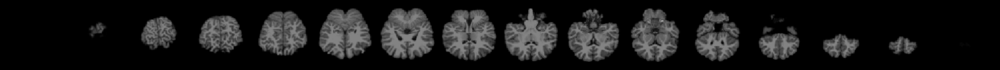

count: 44 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV4D81LEVG.brain.nii.gz


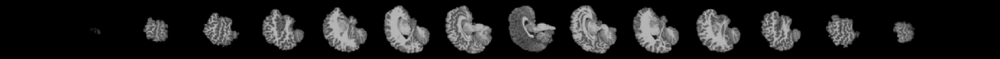

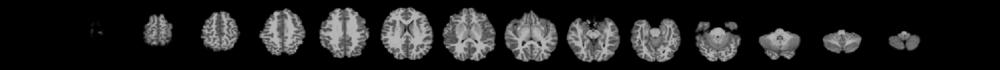

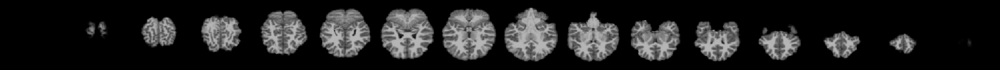

count: 45 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV55BK5ZXT.brain.nii.gz


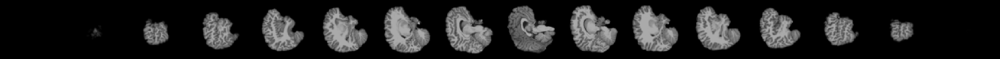

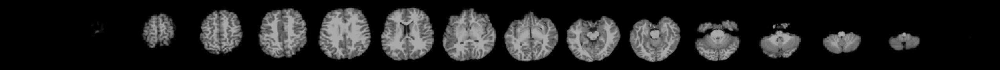

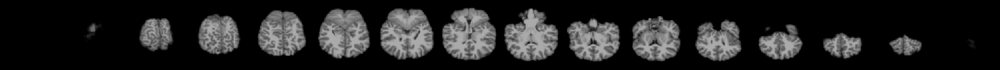

count: 46 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVP1UX7A9Z.brain.nii.gz


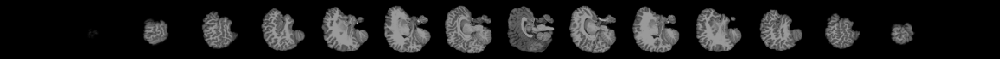

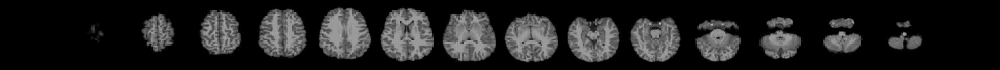

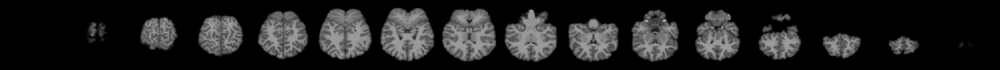

count: 47 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVJ897YYVE.brain.nii.gz


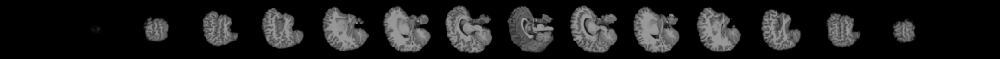

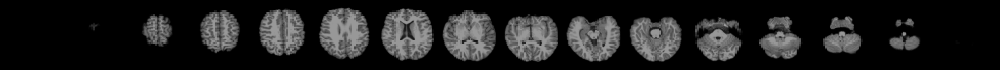

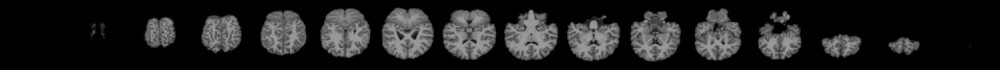

count: 48 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVT1GJUT9Z.brain.nii.gz


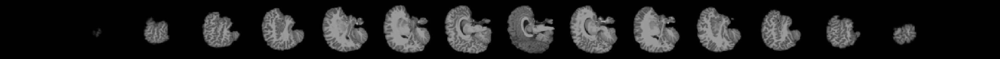

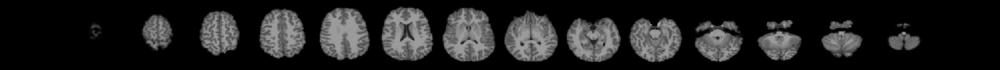

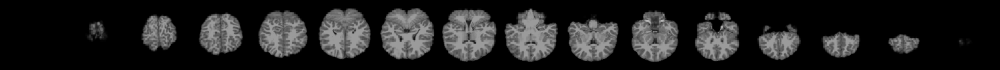

count: 49 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVRVM5WTB0.brain.nii.gz


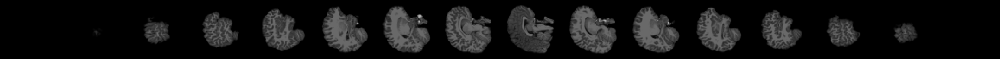

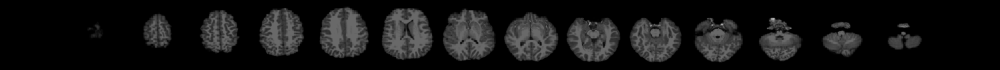

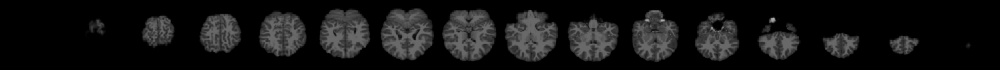

count: 50 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVTM4YT5UD.brain.nii.gz


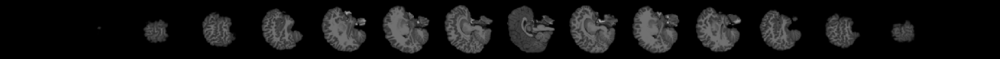

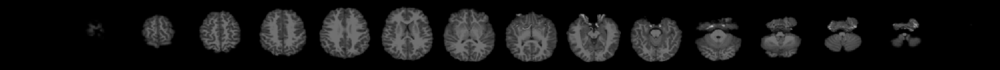

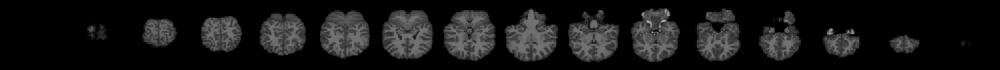

count: 51 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVDJU1GZNN.brain.nii.gz


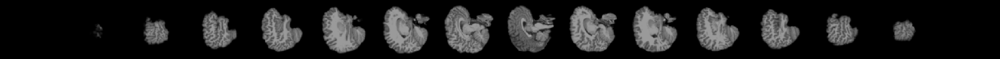

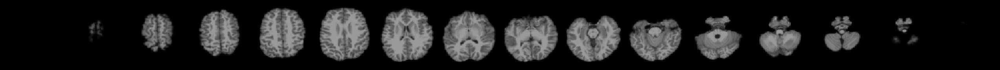

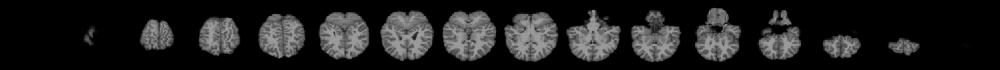

count: 52 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV5K0EKM7F.brain.nii.gz


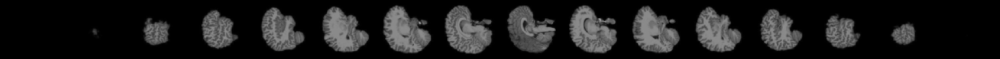

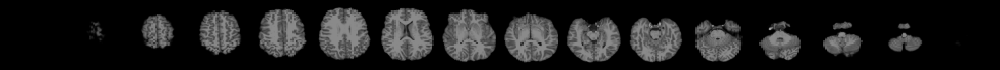

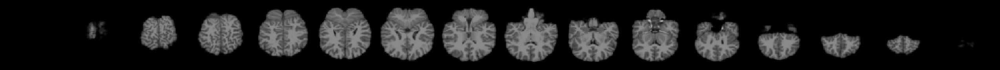

count: 53 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVHZ1URTX6.brain.nii.gz


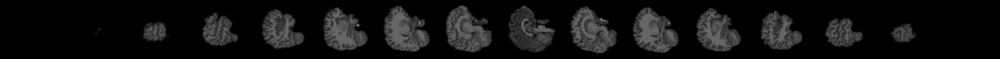

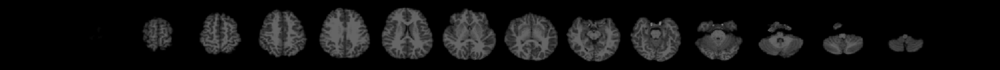

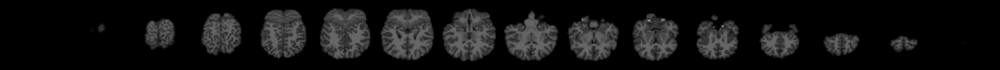

count: 54 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVY2J2A5T4.brain.nii.gz


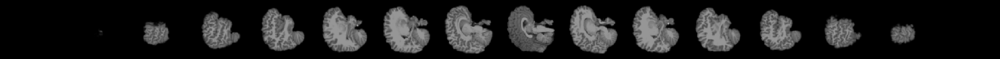

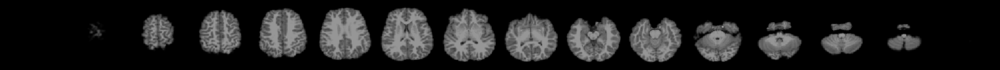

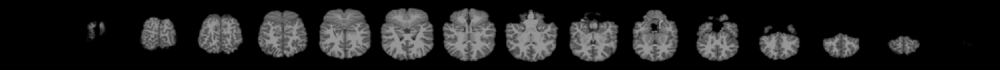

count: 55 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINVWM4B6L05.brain.nii.gz


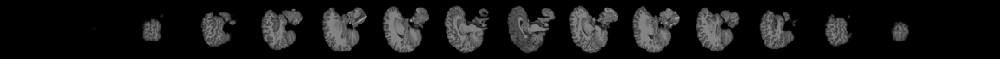

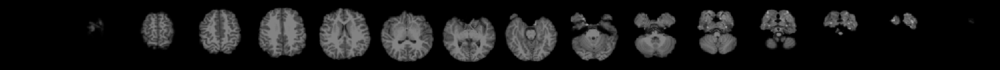

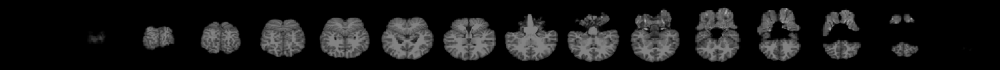

count: 56 processed: /scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain_cropped/sub-NDARINV4EKBZJTW.brain.nii.gz


In [ ]:
if __name__ == '__main__':
    dive('/scratch/bigdata/ABCD/freesurfer/smri/fs_smri_brain') #storage-data / others-scratch